In [2]:
%pylab inline
%load_ext autoreload
%autoreload 2
import sys
import time
sys.path.insert(0,'../..')
import omama as O

Populating the interactive namespace from numpy and matplotlib


In [2]:
# from estimates of user study it was determined that there was about 5.5% bad images in our dataset.
# .055 * 176492 =? 9707 images 
# if outlier detectin had 100% accuracy we could just take the top 9700 images but it is running at bout 80% accuracy so 
# that means in 9707 images there is about 20% good images. .20 * 9707 = 1941.  9707+1941=11648
# Will run phase 2 to pull out good images from the blacklist, running on 11648 images to catch the remaining good images
# from the bad ones.
# 

wl_current_path = '/raid/mpsych/whitelists/2D_whitelist_final.txt' #176,492
bl_current_path = '/raid/mpsych/whitelists/2D_blacklist.txt' #11,648, remove from 176,492
phase2_good_path = '/raid/mpsych/whitelists/phase3_outlierDetection.txt' #2000, add top X good images back into whitelist

In [3]:
wl_cur_list = O.DataHelper.file_to_list(wl_current_path)

In [4]:
len(list(set(wl_cur_list)))

176492

In [5]:
len(wl_cur_list)

176492

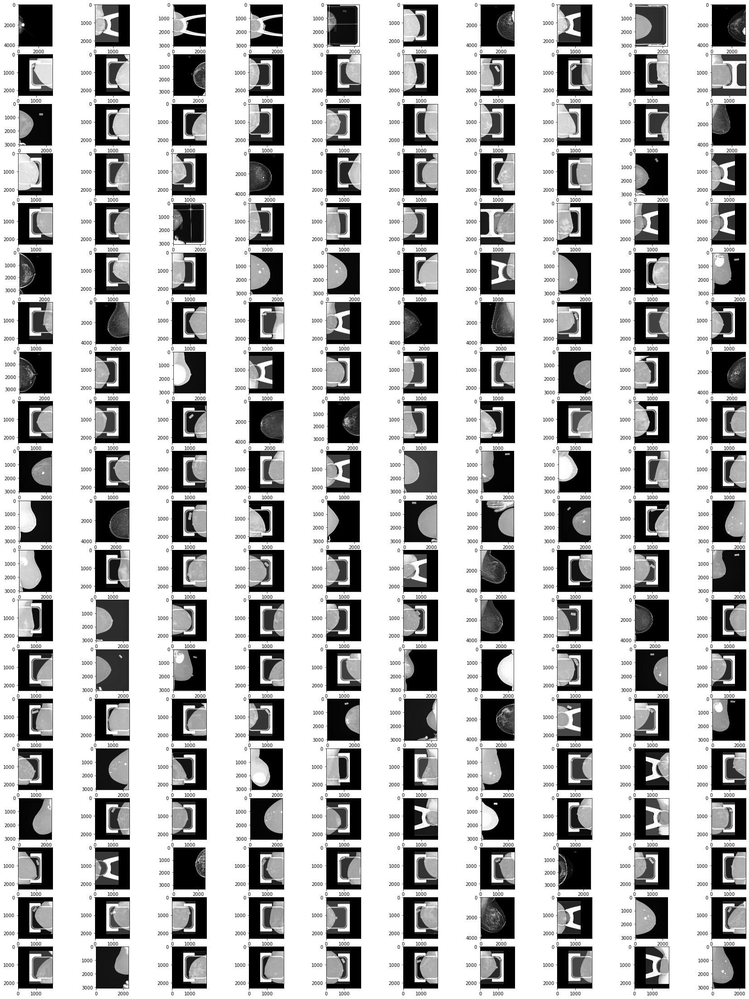

In [6]:
O.DataHelper.view_grid(wl_cur_list[:200], ncols=10)

In [7]:
bl_cur_list = O.DataHelper.file_to_list(bl_current_path)

In [13]:
len(bl_cur_list)

11648

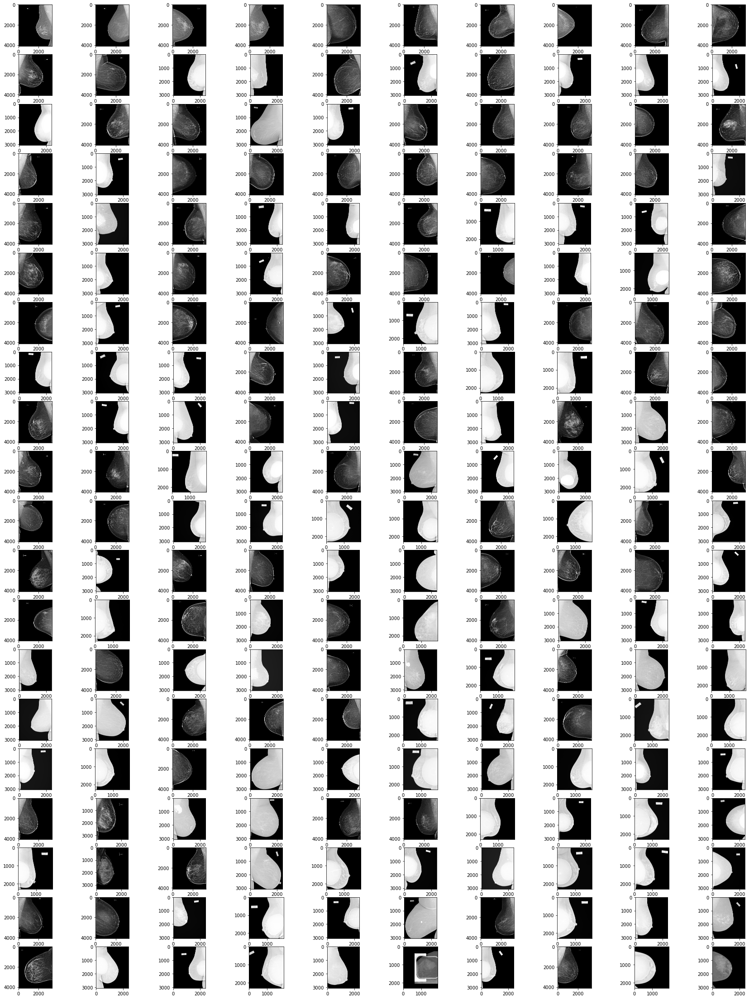

In [14]:
O.DataHelper.view_grid(bl_cur_list[:200], ncols=10)

In [15]:
phase2_list = O.DataHelper.file_to_list(phase2_good_path)

In [19]:
len(phase2_list)

2000

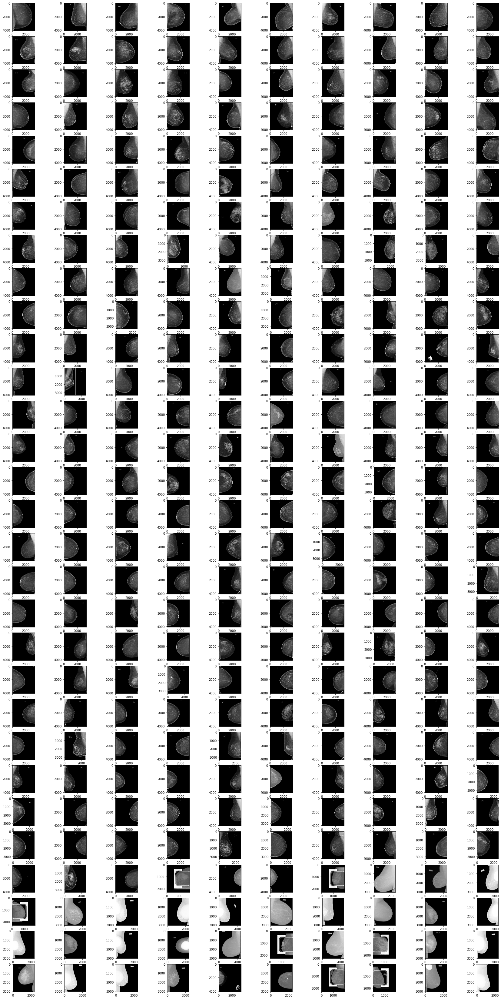

In [17]:
O.DataHelper.view_grid(phase2_list[:300], ncols=10)

In [25]:
new_white_list = O.DataHelper.remove_b_from_a(wl_cur_list, bl_cur_list)

In [26]:
len(new_white_list)

164844

In [27]:
new_white_list = O.DataHelper.add_b_to_a(new_white_list, phase2_list[:260])

In [28]:
len(new_white_list)

165104

In [29]:
path = O.DataHelper.list_to_caselist(new_white_list, "phase4.txt")

In [2]:
ol = O.OmamaLoader(config_num=14)
data_2d = O.Data(ol, load_cache=True)

In [3]:
len(data_2d)

164844

In [4]:
print(data_2d)

Data(namespace(dh_dh2=namespace(total=17, 3D=0, 2D=17),
          dh_dh0new=namespace(total=287, 3D=0, 2D=287),
          dh_dcm_ast=namespace(total=164540, 3D=0, 2D=164540),
          total_all_dicoms=164844,
          total_2d_all=164844,
          total_3d_all=0,
          total_2d_cancer=5587,
          total_2d_preindex=1542,
          total_2d_noncancer=157715,
          total_3d_cancer=0,
          total_3d_preindex=0,
          total_3d_noncancer=0,
          total_cancer=5587,
          total_preindex=1542,
          total_noncancer=157715,
          total_no_label=0))


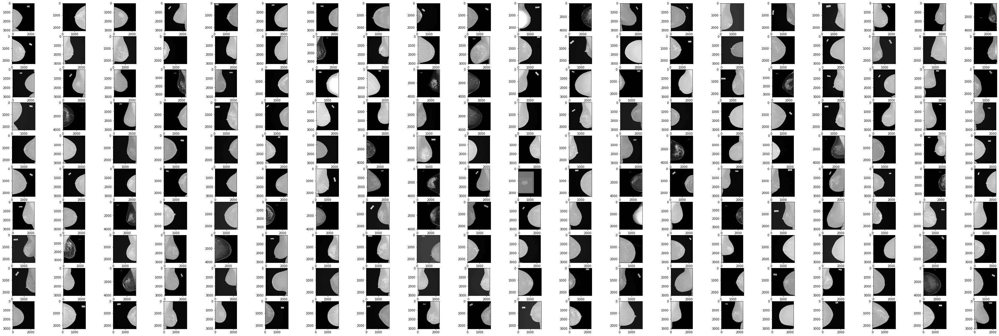

In [11]:
O.DataHelper.view_grid(data_2d[:200])

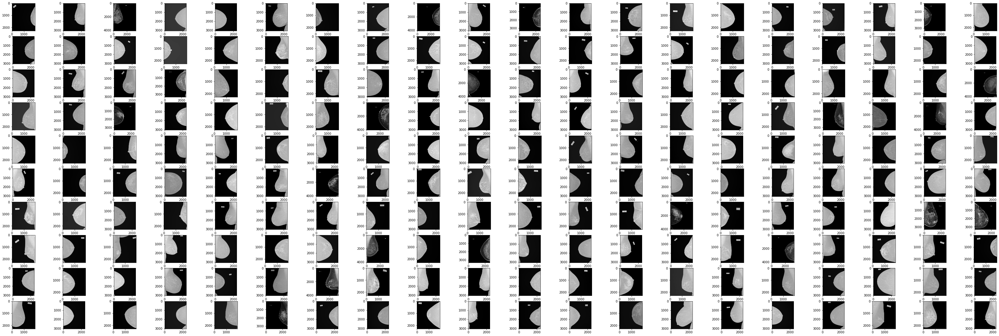

In [12]:
O.DataHelper.view_grid(data_2d[200:400])

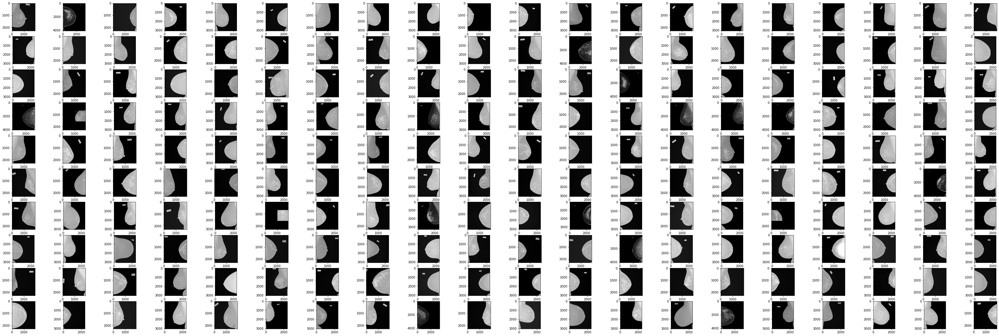

In [13]:
O.DataHelper.view_grid(data_2d[1200:1400])

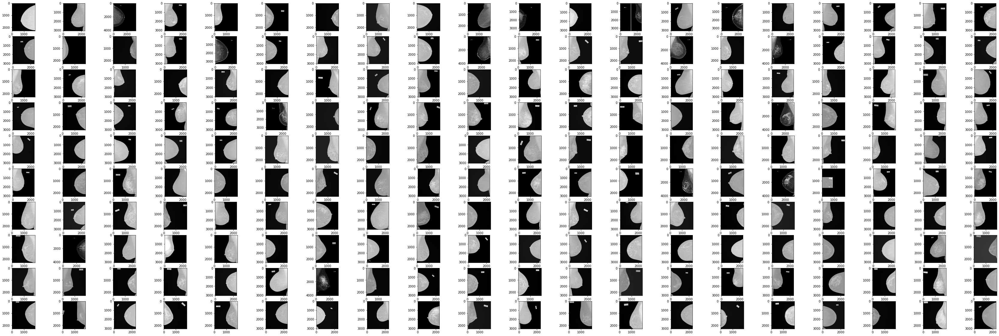

In [14]:
O.DataHelper.view_grid(data_2d[120000:120200])

In [3]:
path1 = "/raid/mpsych/cache_files/outlier_detection_logs/20230108_050031_1_HBOS%_2c44be5cb489141f2b8eaa7384bf4853.txt"
path2 = "/raid/mpsych/cache_files/outlier_detection_logs/20230108_050258_2_HBOS%_2c44be5cb489141f2b8eaa7384bf4853.txt"
path3 = "/raid/mpsych/cache_files/outlier_detection_logs/20230108_050426_3_HBOS%_2c44be5cb489141f2b8eaa7384bf4853.txt"
path4 = "/raid/mpsych/cache_files/outlier_detection_logs/20230108_101829_4_HBOS%_2c44be5cb489141f2b8eaa7384bf4853.txt"

In [5]:
list1 = O.DataHelper.file_to_list(path1)
list2 = O.DataHelper.file_to_list(path2)
list3 = O.DataHelper.file_to_list(path3)
list4 = O.DataHelper.file_to_list(path4)

In [6]:
merged_list = O.DataHelper.merge_lists(list1,list2,list3,list4)

In [7]:
len(merged_list)

164844

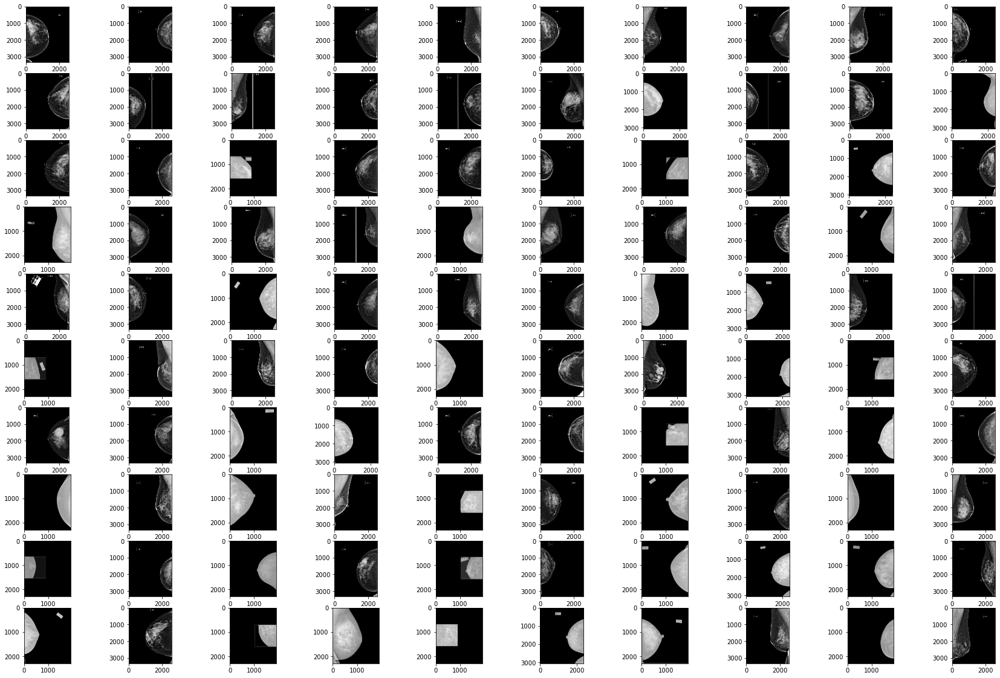

In [28]:
O.DataHelper.view_grid(merged_list[163000:163100], ncols=10)

In [31]:
O.DataHelper.list_to_caselist(merged_list, "phase3a.txt")

'phase3a.txt'

In [15]:
path1a = "/raid/mpsych/cache_files/outlier_detection_logs/20230111_140046_1_SUOD%_093f43dd20fe19e0f5c9268a64cd650b.txt"
path2a = "/raid/mpsych/cache_files/outlier_detection_logs/20230111_140216_2_SUOD%_093f43dd20fe19e0f5c9268a64cd650b.txt"
path3a = "/raid/mpsych/cache_files/outlier_detection_logs/20230111_140114_3_SUOD%_093f43dd20fe19e0f5c9268a64cd650b.txt"
path4a = "/raid/mpsych/cache_files/outlier_detection_logs/20230111_192527_4_SUOD%_093f43dd20fe19e0f5c9268a64cd650b.txt"

In [16]:
list1 = O.DataHelper.file_to_list(path1a)
list2 = O.DataHelper.file_to_list(path2a)
list3 = O.DataHelper.file_to_list(path3a)
list4 = O.DataHelper.file_to_list(path4a)
merged_list2 = O.DataHelper.merge_lists(list1,list2,list3,list4)

In [17]:
len(merged_list2)

164844

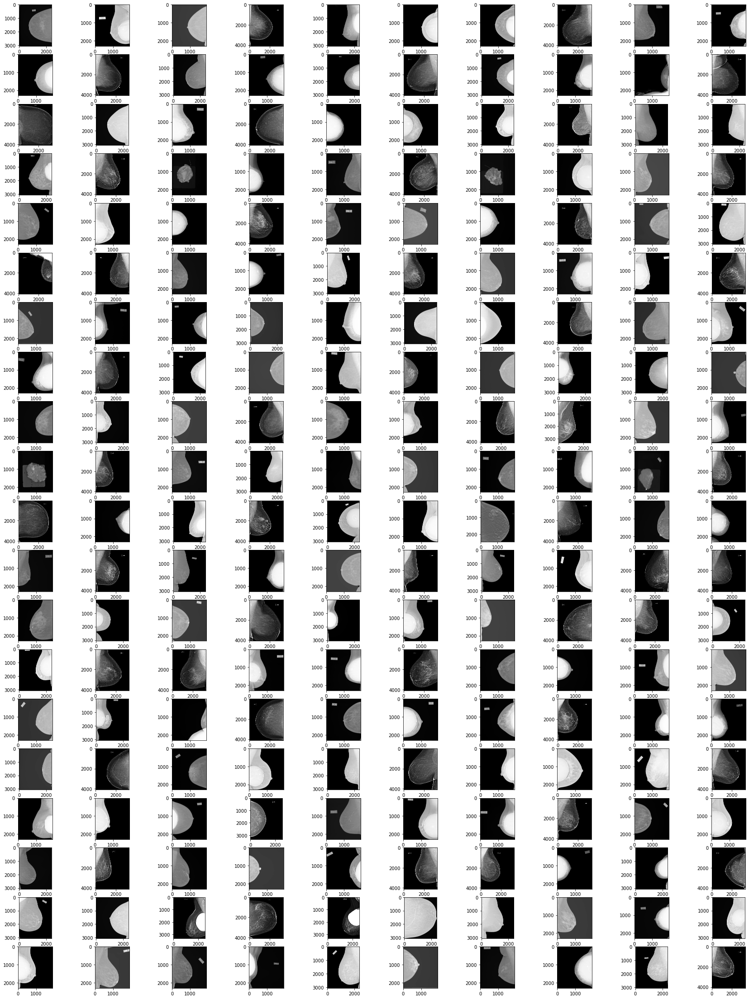

In [20]:
O.DataHelper.view_grid(merged_list2[400:600], ncols=10)